Loading expression matrix from: F:\spatial_data_lung\SSc_1_1_2_raw\cell_feature_matrix
Parsing spatial polygons from: F:\spatial_data_lung\SSc_1_1_2_raw\cells.zarr
Merging annotation file: F:\spatial_data_lung\ssc112_annotation_map.csv
Finished. Annotated cells: 82224
========== Starting NicheMap Pipeline: SSc_1_1_2 ==========


NicheMap pipeline:   0%|          | 0/5 [00:00<?, ?step/s]

[ECM_score] Calculating gene signature score
[Score] ECM_score
Genes in CSV: 183
Valid genes: 17
Stored in adata.obs['ECM_score']
Figure saved to F:\spatial_data_lung\Xenium_Result_data\SSc_1_1_2_result\ECM_score\Spatial_ECM_score.png
[ECM_score] Building spatial grids (bins=300, sigma_peak=2)
[Grid] ECM_score
Shape: (300, 300), Non-empty: 31560
Figure saved to F:\spatial_data_lung\Xenium_Result_data\SSc_1_1_2_result\ECM_score\Figure_1A_Raw_ECM_score_grid_map.png
Figure saved to F:\spatial_data_lung\Xenium_Result_data\SSc_1_1_2_result\ECM_score\Figure_1B_Grid_cell_density.png
[ECM_score] Finding niche seeds (intensity_sigma=1.5)
Figure saved to F:\spatial_data_lung\Xenium_Result_data\SSc_1_1_2_result\ECM_score\Figure_2A_Detected_niche_peaks.png
Figure saved to F:\spatial_data_lung\Xenium_Result_data\SSc_1_1_2_result\ECM_score\Figure_2B_Peak_positions_on_spatial_map.png
[ECM_score] Segmenting niches (expansion_sigma=1.0)
Figure saved to F:\spatial_data_lung\Xenium_Result_data\SSc_1_1_2_

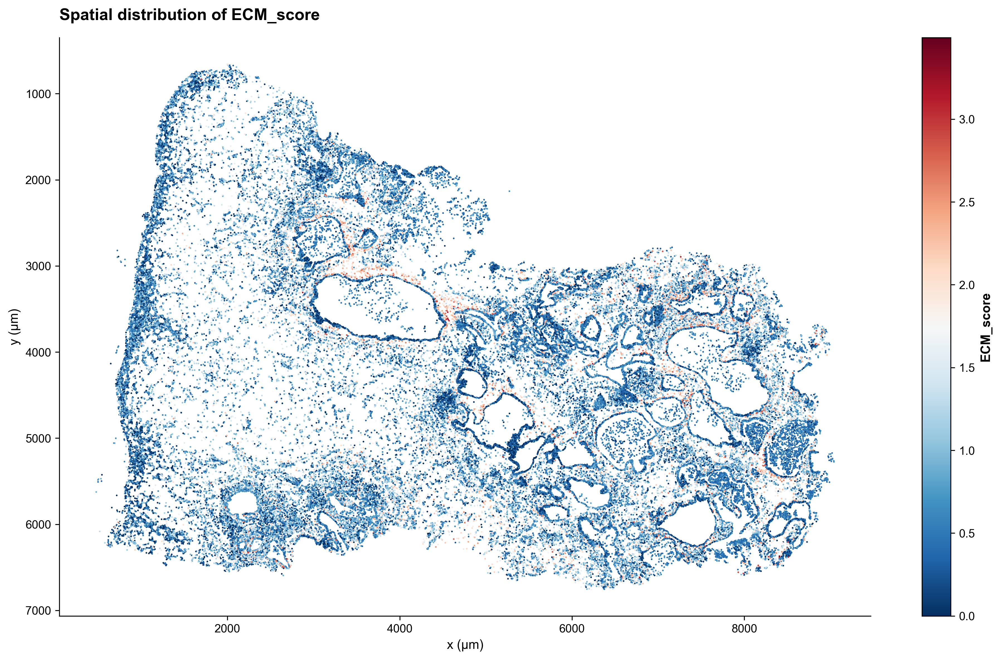

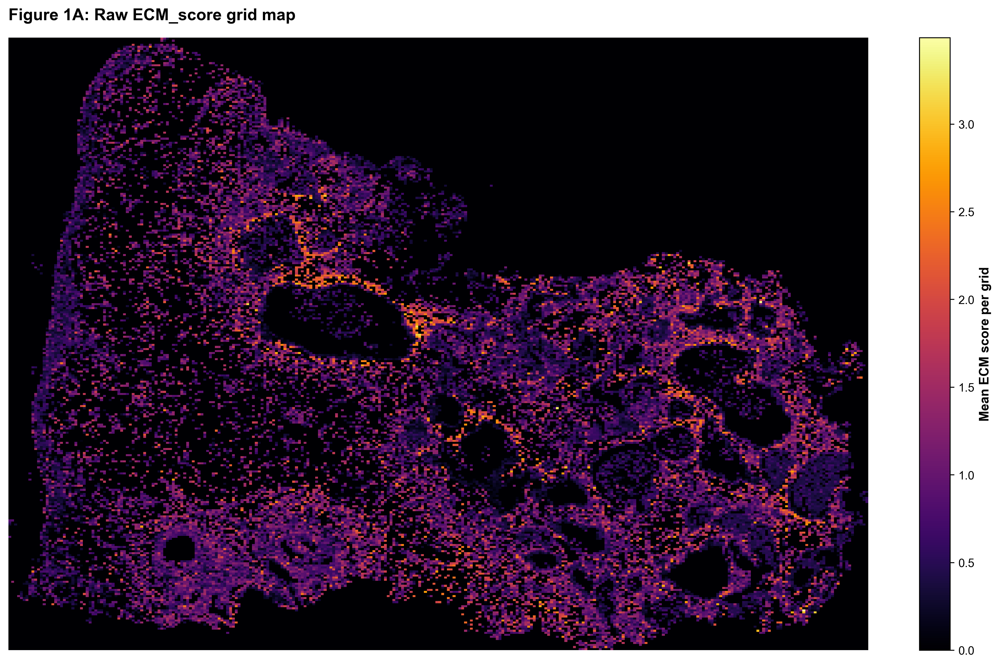

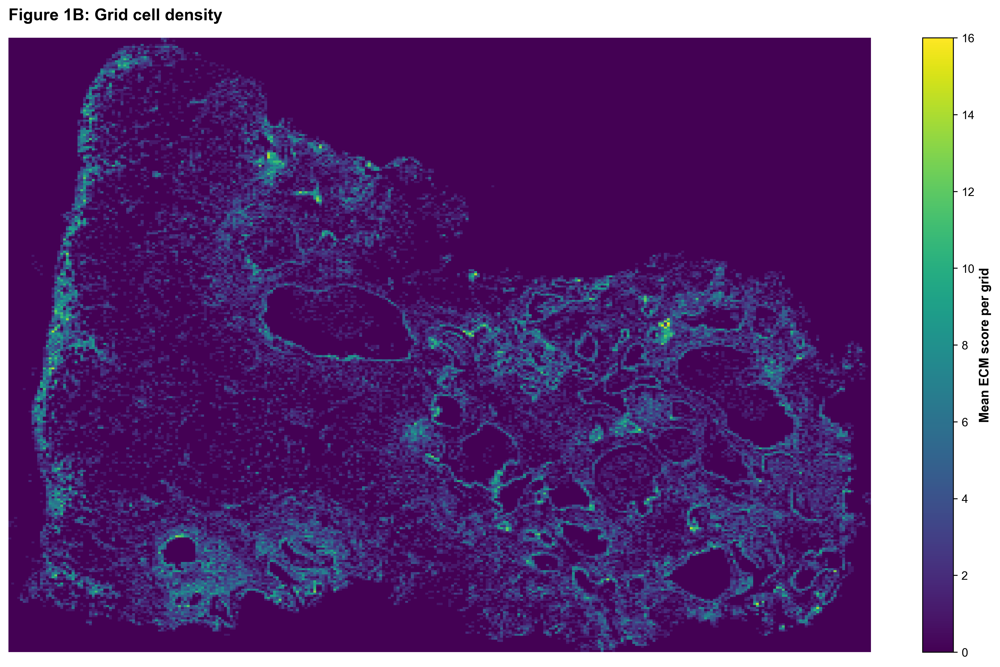

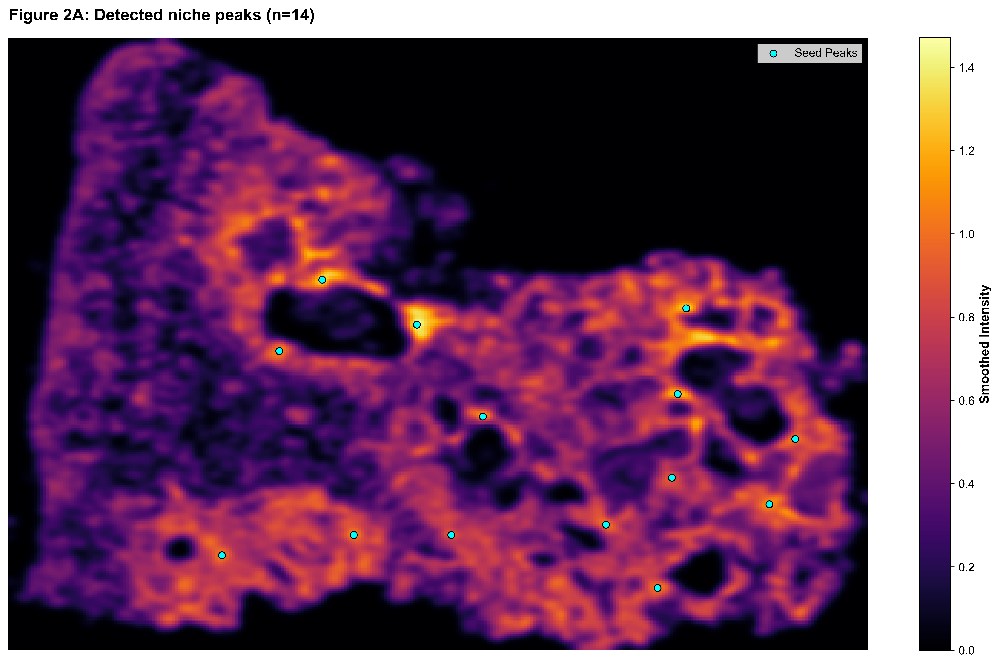

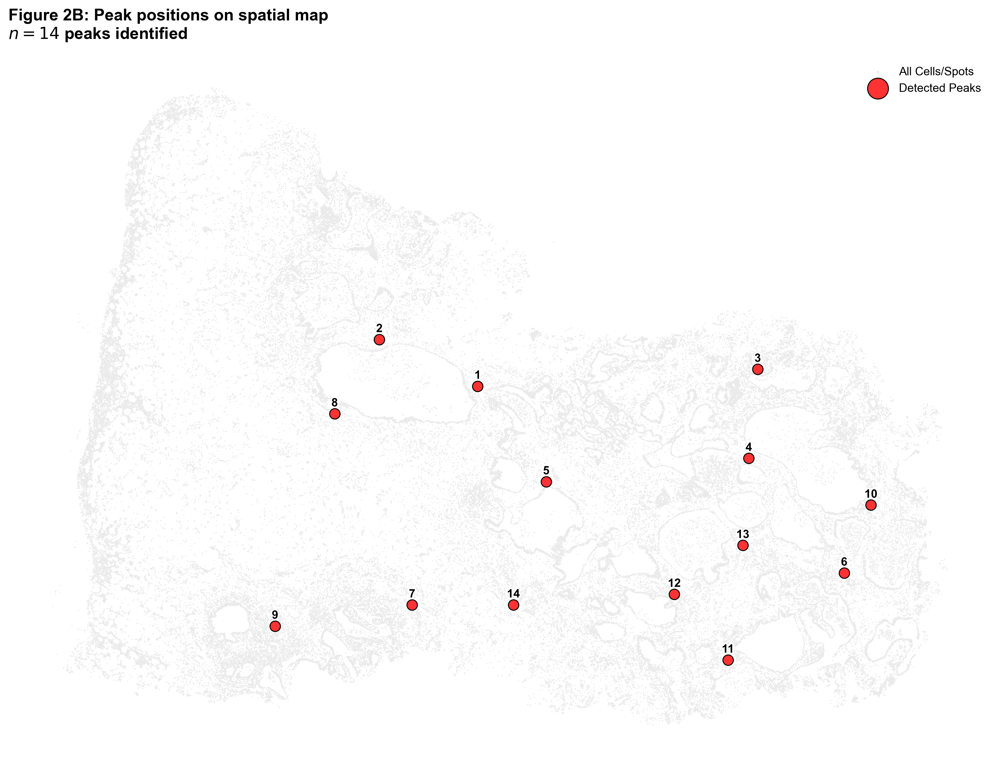

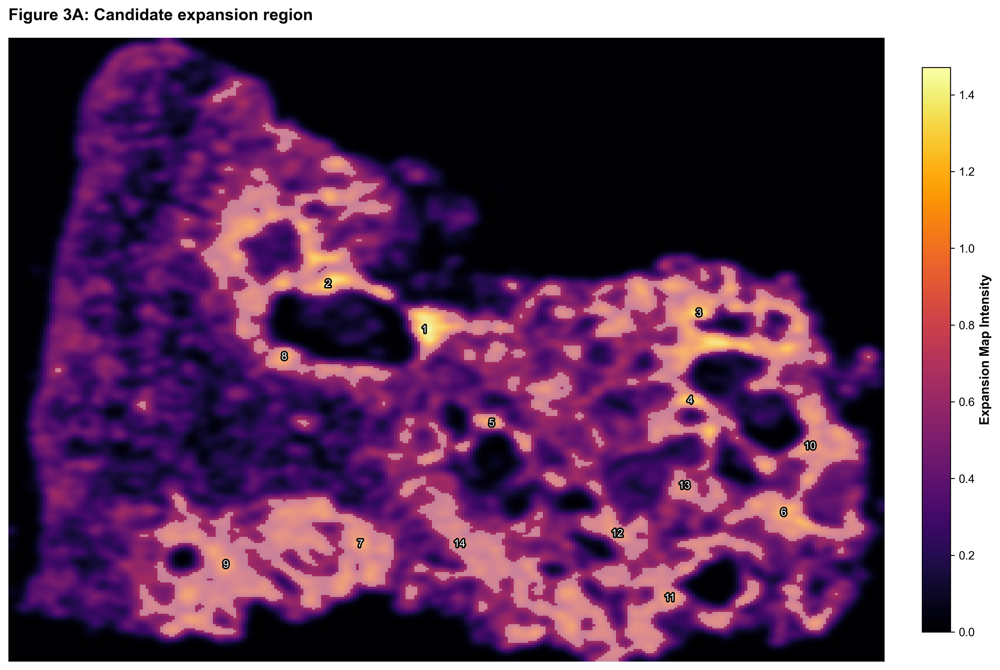

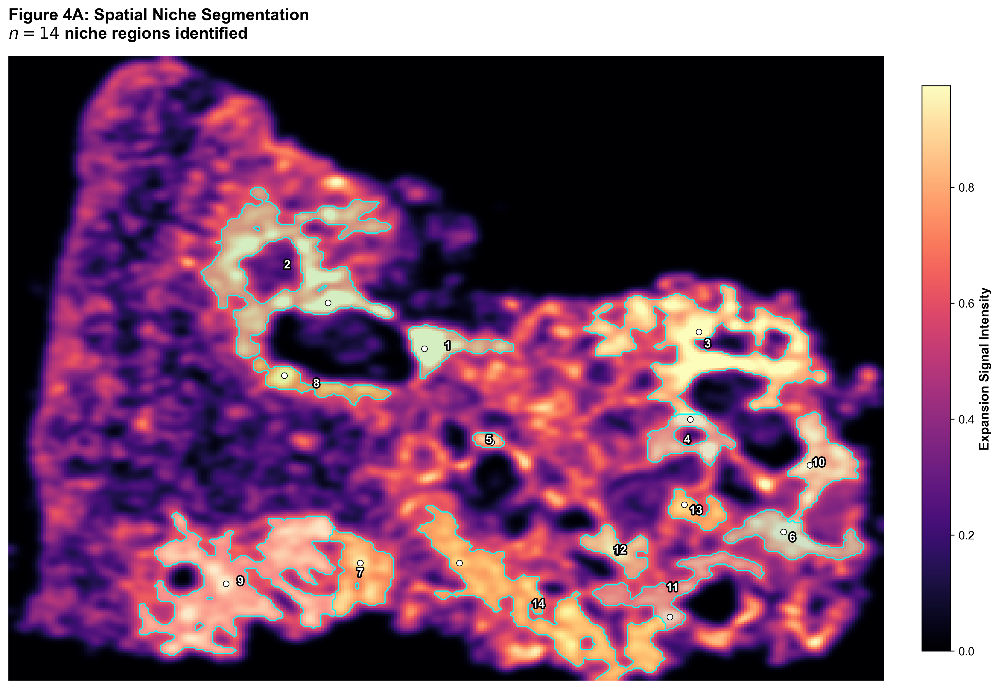

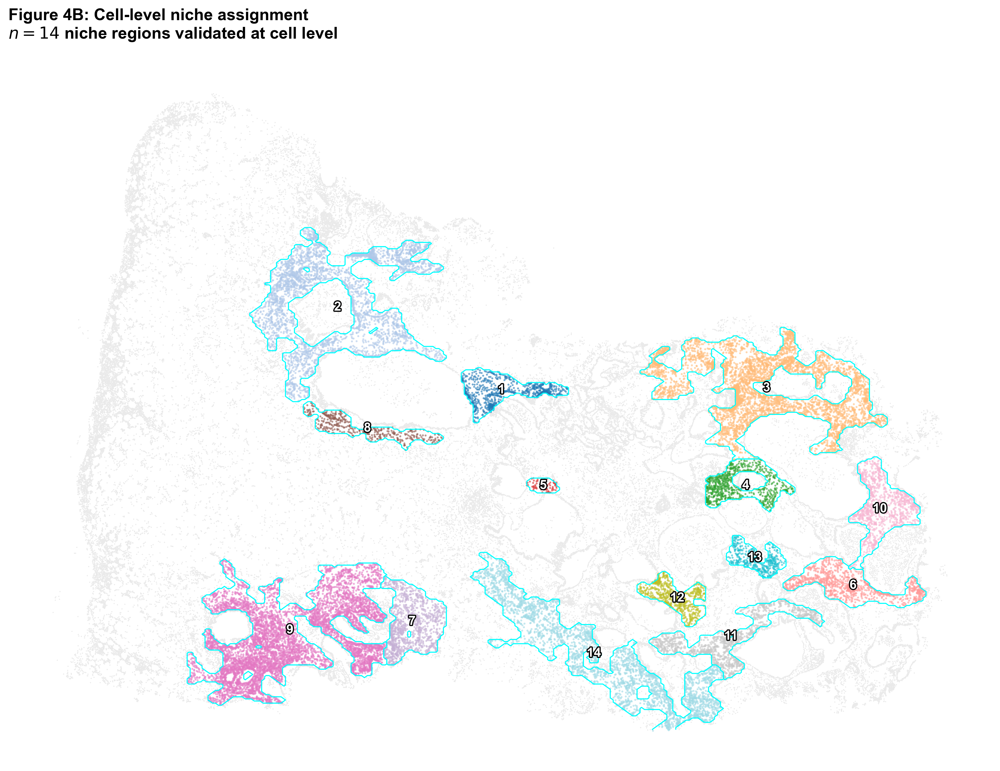

In [1]:
import os
import sys
sys.path.append(os.path.abspath("C://Users//heyi//Desktop/NicheMap-main"))
import nichemap as nm

base_dir = r"F:\spatial_data_lung\SSc_1_1_2_raw"
anno_file = r"F:\spatial_data_lung\ssc112_annotation_map.csv"
gene_list = r"F:\spatial_data_lung\marker_genes\ECM-gene.csv"
score_id = 'ECM_score'
peak_intensity=1.5
exp_intensity=1.0
sample_pref = 'SSc_1_1_2'
out_dir = rf"F:\spatial_data_lung\Xenium_Result_data\SSc_1_1_2_result\{score_id}"
os.makedirs(out_dir, exist_ok=True)

adata = nm.preprocess.load_xenium_data(base_dir=base_dir, anno_file=anno_file)


model = nm.NicheMap(
    adata=adata,
    score_id=score_id,
    sample_prefix=sample_pref,
    out_dir=out_dir
)

final_adata = model.run(
    gene_list_csv=gene_list,
    bins=300,
    peak_intensity=peak_intensity,
    exp_intensity=exp_intensity
)